In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from pathlib import Path
from scipy import stats
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import os

warnings.filterwarnings("ignore")

# Set up professional plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 9
plt.rcParams['ytick.labelsize'] = 9
plt.rcParams['legend.fontsize'] = 9

%matplotlib inline

# Create output directory for plots
output_dir = Path("../eda_plots")
output_dir.mkdir(exist_ok=True)
print(f"Output directory created: {output_dir.absolute()}")


Output directory created: /Users/edonisalijaj/Downloads/tsfdc/notebooks/../eda_plots


In [2]:
# Load data
model_df = pd.read_csv("../data/atc3_monthly_full.csv")

# Convert month_start to datetime
model_df['month_start'] = pd.to_datetime(model_df['month_start'])

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print("Data loaded successfully!")
print(f"Shape: {model_df.shape}")
print(f"Date range: {model_df['month_start'].min()} to {model_df['month_start'].max()}")
print(f"Number of ATC3 codes: {model_df['atc3_code'].nunique()}")


Data loaded successfully!
Shape: (1176, 10)
Date range: 2023-05-01 00:00:00 to 2025-01-01 00:00:00
Number of ATC3 codes: 56


In [3]:
# ============================================================================
# 1. DATA OVERVIEW & QUALITY CHECKS
# ============================================================================

print("=" * 80)
print("DATA OVERVIEW & QUALITY CHECKS")
print("=" * 80)

# Basic info
print("\n1.1 Basic Information:")
print("-" * 40)
model_df.info()
print(f"\nMemory usage: {model_df.memory_usage(deep=True).sum() / 1024:.2f} KB")

# Missing values
print("\n1.2 Missing Values:")
print("-" * 40)
missing = model_df.isna().sum()
missing_pct = (missing / len(model_df)) * 100
missing_df = pd.DataFrame({
    'Missing Count': missing,
    'Missing %': missing_pct
})
print(missing_df[missing_df['Missing Count'] > 0])

# Data range
print("\n1.3 Data Range:")
print("-" * 40)
print(f"Time period: {model_df['month_start'].min()} to {model_df['month_start'].max()}")
print(f"Number of months: {model_df['month_start'].nunique()}")
print(f"Number of ATC3 codes: {model_df['atc3_code'].nunique()}")
print(f"Total observations: {len(model_df)}")

# Check for negative values
print("\n1.4 Data Quality Checks:")
print("-" * 40)
print(f"Negative packages: {(model_df['packages'] < 0).sum()}")
print(f"Zero packages: {(model_df['packages'] == 0).sum()} ({(model_df['packages'] == 0).sum() / len(model_df) * 100:.2f}%)")
print(f"Negative lag values: {((model_df[['packages_lag1', 'packages_lag2', 'packages_lag3']] < 0).any(axis=1)).sum()}")

# Summary statistics
print("\n1.5 Summary Statistics:")
print("-" * 40)
print(model_df.describe())



DATA OVERVIEW & QUALITY CHECKS

1.1 Basic Information:
----------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1176 entries, 0 to 1175
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   atc3_code       1176 non-null   object        
 1   month_start     1176 non-null   datetime64[ns]
 2   packages        1176 non-null   int64         
 3   year            1176 non-null   int64         
 4   month           1176 non-null   int64         
 5   month_index     1176 non-null   int64         
 6   packages_lag1   1176 non-null   float64       
 7   packages_lag2   1176 non-null   float64       
 8   packages_lag3   1176 non-null   float64       
 9   packages_lag12  672 non-null    float64       
dtypes: datetime64[ns](1), float64(4), int64(4), object(1)
memory usage: 92.0+ KB

Memory usage: 143.68 KB

1.2 Missing Values:
----------------------------------------
    

In [4]:
# Summary statistics by ATC3 code
print("\n1.6 Summary Statistics by ATC3 Code:")
print("-" * 40)
summary_by_atc3 = model_df.groupby('atc3_code')['packages'].agg([
    'count', 'sum', 'mean', 'std', 'min', 'max', 'median'
]).round(2)
summary_by_atc3.columns = ['n_months', 'total_packages', 'mean', 'std', 'min', 'max', 'median']
summary_by_atc3 = summary_by_atc3.sort_values('total_packages', ascending=False)
print(summary_by_atc3.head(20))

# Identify top ATC3 codes
top_n = 10
top_atc3_codes = summary_by_atc3.head(top_n).index.tolist()
print(f"\nTop {top_n} ATC3 codes by total consumption:")
print(top_atc3_codes)


1.6 Summary Statistics by ATC3 Code:
----------------------------------------
           n_months  total_packages   mean    std  min  max  median
atc3_code                                                          
C09B             21            1547  73.67  25.53    8  119    76.0
A02B             21            1475  70.24  23.59    9   98    76.0
C07A             21            1395  66.43  23.23    3   98    72.0
M01A             21            1313  62.52  23.93    5  101    67.0
N05B             21            1097  52.24  22.20    1   94    56.0
B01A             21            1021  48.62  20.33    1   75    52.0
C10A             21             826  39.33  14.50    7   70    38.0
C09A             21             658  31.33   9.76    0   45    32.0
A10B             21             658  31.33  14.07    0   49    37.0
N02A             21             500  23.81  11.93    0   46    25.0
R03A             21             418  19.90  10.78    0   43    18.0
C08C             21             401  


TEMPORAL ANALYSIS


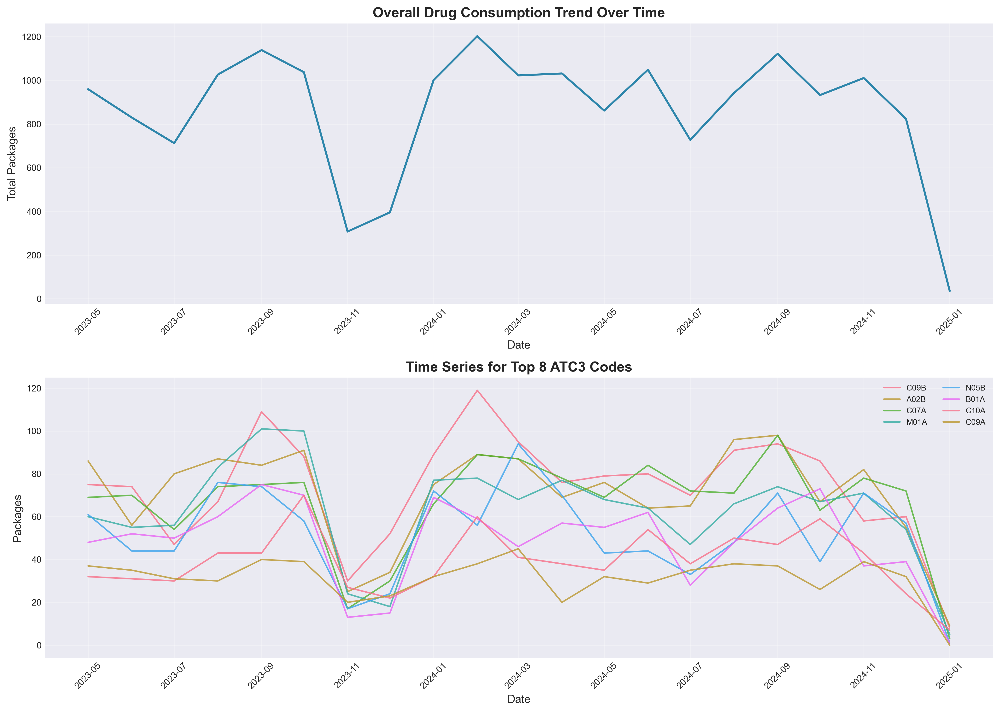

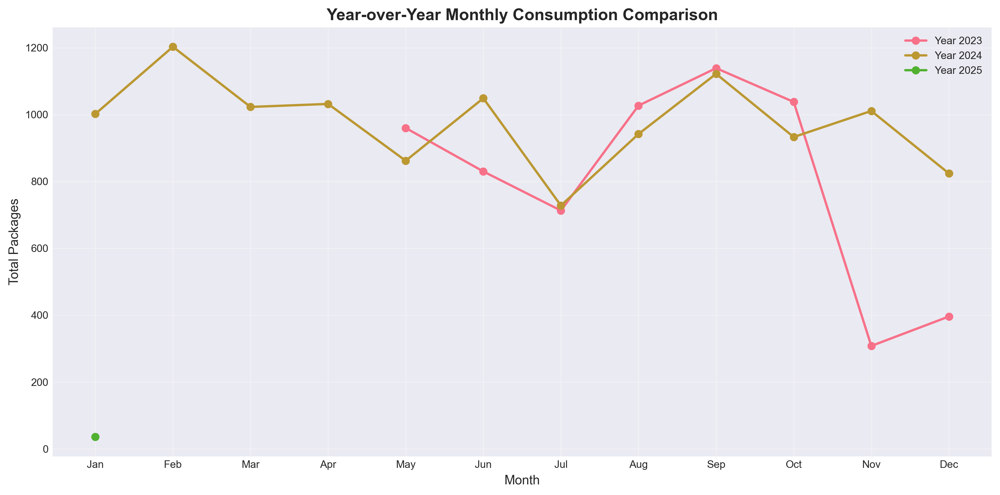

In [5]:
# ============================================================================
# 2. TEMPORAL ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("TEMPORAL ANALYSIS")
print("=" * 80)

# Overall consumption trend
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Plot 1: Overall trend
overall_trend = model_df.groupby('month_start')['packages'].sum()
axes[0].plot(overall_trend.index, overall_trend.values, linewidth=2, color='#2E86AB')
axes[0].set_title('Overall Drug Consumption Trend Over Time', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Date', fontsize=11)
axes[0].set_ylabel('Total Packages', fontsize=11)
axes[0].grid(True, alpha=0.3)
axes[0].tick_params(axis='x', rotation=45)

# Plot 2: Top ATC3 codes overlaid
for i, atc3 in enumerate(top_atc3_codes[:8]):
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    axes[1].plot(subset['month_start'], subset['packages'], 
                 label=atc3, linewidth=1.5, alpha=0.8)

axes[1].set_title(f'Time Series for Top {min(8, len(top_atc3_codes))} ATC3 Codes', 
                 fontsize=14, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=11)
axes[1].set_ylabel('Packages', fontsize=11)
axes[1].legend(loc='best', ncol=2, fontsize=8)
axes[1].grid(True, alpha=0.3)
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(output_dir / '02_temporal_trends.png', bbox_inches='tight', dpi=300)
plt.show()

# Year-over-year comparison
if model_df['year'].nunique() > 1:
    fig, ax = plt.subplots(figsize=(12, 6))
    yearly_monthly = model_df.groupby(['year', 'month'])['packages'].sum().reset_index()
    
    for year in sorted(model_df['year'].unique()):
        year_data = yearly_monthly[yearly_monthly['year'] == year]
        ax.plot(year_data['month'], year_data['packages'], 
               marker='o', label=f'Year {year}', linewidth=2, markersize=6)
    
    ax.set_title('Year-over-Year Monthly Consumption Comparison', fontsize=14, fontweight='bold')
    ax.set_xlabel('Month', fontsize=11)
    ax.set_ylabel('Total Packages', fontsize=11)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(output_dir / '02_yoy_comparison.png', bbox_inches='tight', dpi=300)
    plt.show()


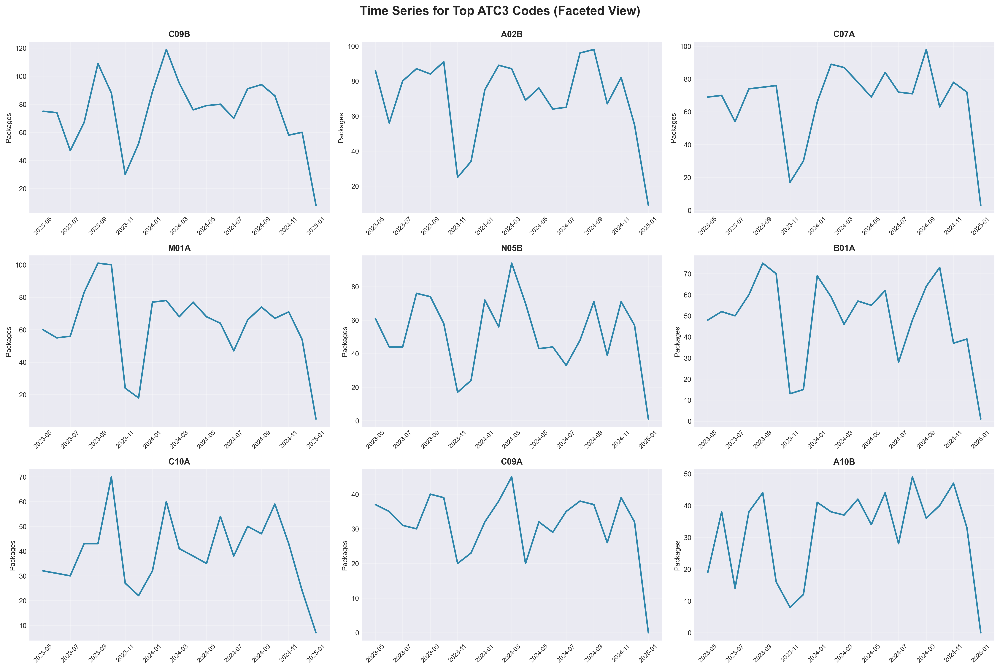

In [6]:
# Faceted plot for top ATC3 codes
n_top = min(9, len(top_atc3_codes))
fig, axes = plt.subplots(3, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, atc3 in enumerate(top_atc3_codes[:n_top]):
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    axes[idx].plot(subset['month_start'], subset['packages'], linewidth=2, color='#2E86AB')
    axes[idx].set_title(f'{atc3}', fontsize=11, fontweight='bold')
    axes[idx].set_ylabel('Packages', fontsize=9)
    axes[idx].grid(True, alpha=0.3)
    axes[idx].tick_params(axis='x', rotation=45, labelsize=8)

# Hide unused subplots
for idx in range(n_top, len(axes)):
    axes[idx].axis('off')

plt.suptitle('Time Series for Top ATC3 Codes (Faceted View)', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(output_dir / '02_faceted_timeseries.png', bbox_inches='tight', dpi=300)
plt.show()



DISTRIBUTION ANALYSIS


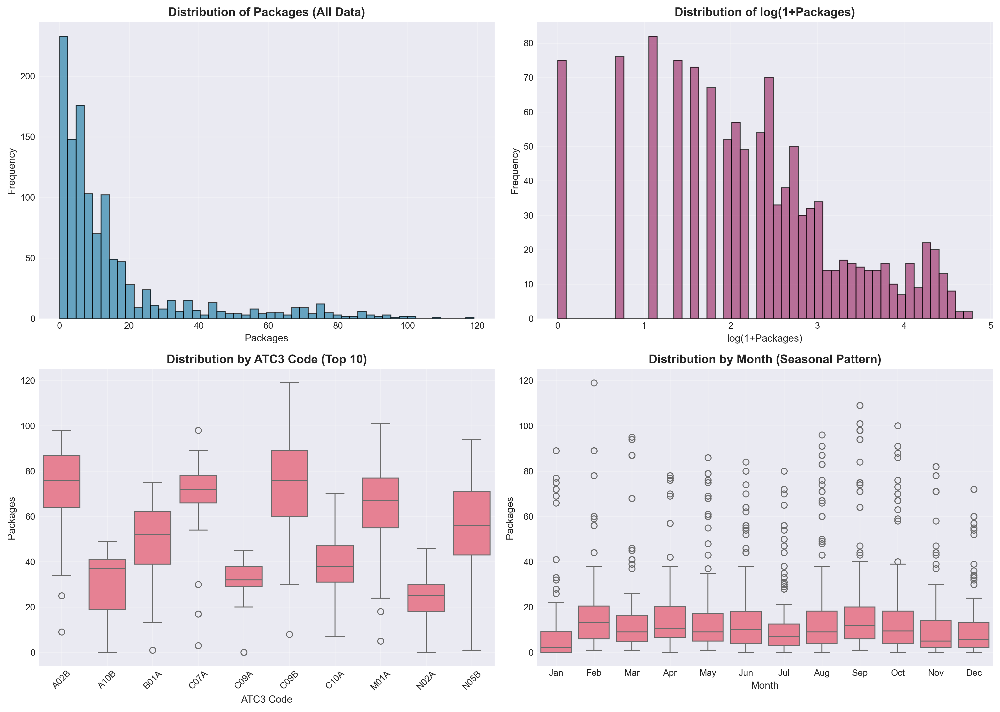


3.1 Distribution Statistics:
----------------------------------------
Skewness: 2.252
Kurtosis: 4.767
Mean: 15.46
Median: 8.00
Std: 20.38

After log(1+x) transformation:
Skewness: 0.032
Kurtosis: -0.391


In [7]:
# ============================================================================
# 3. DISTRIBUTION ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("DISTRIBUTION ANALYSIS")
print("=" * 80)

# Overall distribution
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Histogram
axes[0, 0].hist(model_df['packages'], bins=50, edgecolor='black', alpha=0.7, color='#2E86AB')
axes[0, 0].set_title('Distribution of Packages (All Data)', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Packages', fontsize=10)
axes[0, 0].set_ylabel('Frequency', fontsize=10)
axes[0, 0].grid(True, alpha=0.3)

# Log transformation
log_packages = np.log1p(model_df['packages'])  # log1p to handle zeros
axes[0, 1].hist(log_packages, bins=50, edgecolor='black', alpha=0.7, color='#A23B72')
axes[0, 1].set_title('Distribution of log(1+Packages)', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('log(1+Packages)', fontsize=10)
axes[0, 1].set_ylabel('Frequency', fontsize=10)
axes[0, 1].grid(True, alpha=0.3)

# Box plot by ATC3 code (top codes)
top_subset = model_df[model_df['atc3_code'].isin(top_atc3_codes[:10])]
sns.boxplot(data=top_subset, x='atc3_code', y='packages', ax=axes[1, 0])
axes[1, 0].set_title('Distribution by ATC3 Code (Top 10)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('ATC3 Code', fontsize=10)
axes[1, 0].set_ylabel('Packages', fontsize=10)
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True, alpha=0.3)

# Box plot by month
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
sns.boxplot(data=model_df, x='month', y='packages', ax=axes[1, 1])
axes[1, 1].set_title('Distribution by Month (Seasonal Pattern)', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Month', fontsize=10)
axes[1, 1].set_ylabel('Packages', fontsize=10)
axes[1, 1].set_xticklabels(month_names)
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(output_dir / '03_distribution_analysis.png', bbox_inches='tight', dpi=300)
plt.show()

# Skewness and kurtosis
print("\n3.1 Distribution Statistics:")
print("-" * 40)
skewness = model_df['packages'].skew()
kurtosis = model_df['packages'].kurtosis()
print(f"Skewness: {skewness:.3f}")
print(f"Kurtosis: {kurtosis:.3f}")
print(f"Mean: {model_df['packages'].mean():.2f}")
print(f"Median: {model_df['packages'].median():.2f}")
print(f"Std: {model_df['packages'].std():.2f}")

# Log transformation statistics
log_skewness = log_packages.skew()
log_kurtosis = log_packages.kurtosis()
print(f"\nAfter log(1+x) transformation:")
print(f"Skewness: {log_skewness:.3f}")
print(f"Kurtosis: {log_kurtosis:.3f}")



CORRELATION ANALYSIS


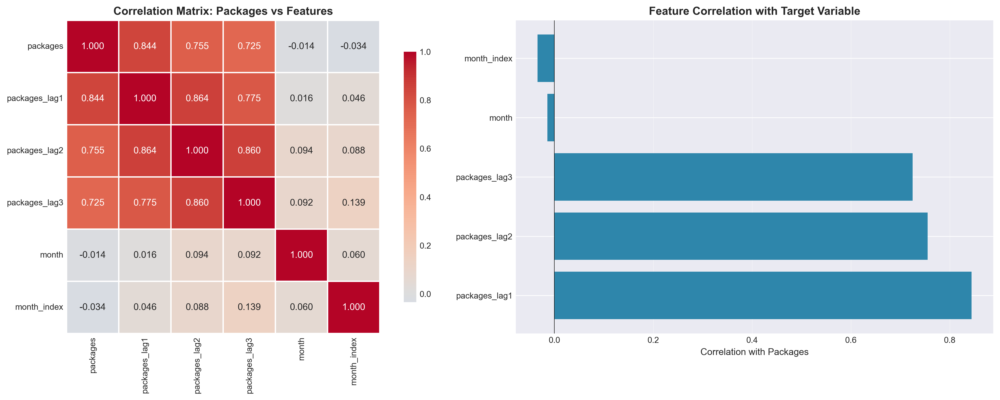


4.1 Correlation with Target Variable:
----------------------------------------
packages_lag1    0.844149
packages_lag2    0.755265
packages_lag3    0.724906
month           -0.014436
month_index     -0.034207
Name: packages, dtype: float64


In [8]:
# ============================================================================
# 4. CORRELATION ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("CORRELATION ANALYSIS")
print("=" * 80)

# Correlation matrix
corr_cols = ['packages', 'packages_lag1', 'packages_lag2', 'packages_lag3', 'month', 'month_index']
corr_matrix = model_df[corr_cols].corr()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap
sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='coolwarm', center=0,
           square=True, linewidths=1, cbar_kws={"shrink": 0.8}, ax=axes[0])
axes[0].set_title('Correlation Matrix: Packages vs Features', fontsize=12, fontweight='bold')

# Bar plot of correlations with target
target_corr = corr_matrix['packages'].drop('packages').sort_values(ascending=False)
axes[1].barh(range(len(target_corr)), target_corr.values, color='#2E86AB')
axes[1].set_yticks(range(len(target_corr)))
axes[1].set_yticklabels(target_corr.index)
axes[1].set_xlabel('Correlation with Packages', fontsize=10)
axes[1].set_title('Feature Correlation with Target Variable', fontsize=12, fontweight='bold')
axes[1].grid(True, alpha=0.3, axis='x')
axes[1].axvline(x=0, color='black', linestyle='-', linewidth=0.5)

plt.tight_layout()
plt.savefig(output_dir / '04_correlation_analysis.png', bbox_inches='tight', dpi=300)
plt.show()

print("\n4.1 Correlation with Target Variable:")
print("-" * 40)
print(target_corr)


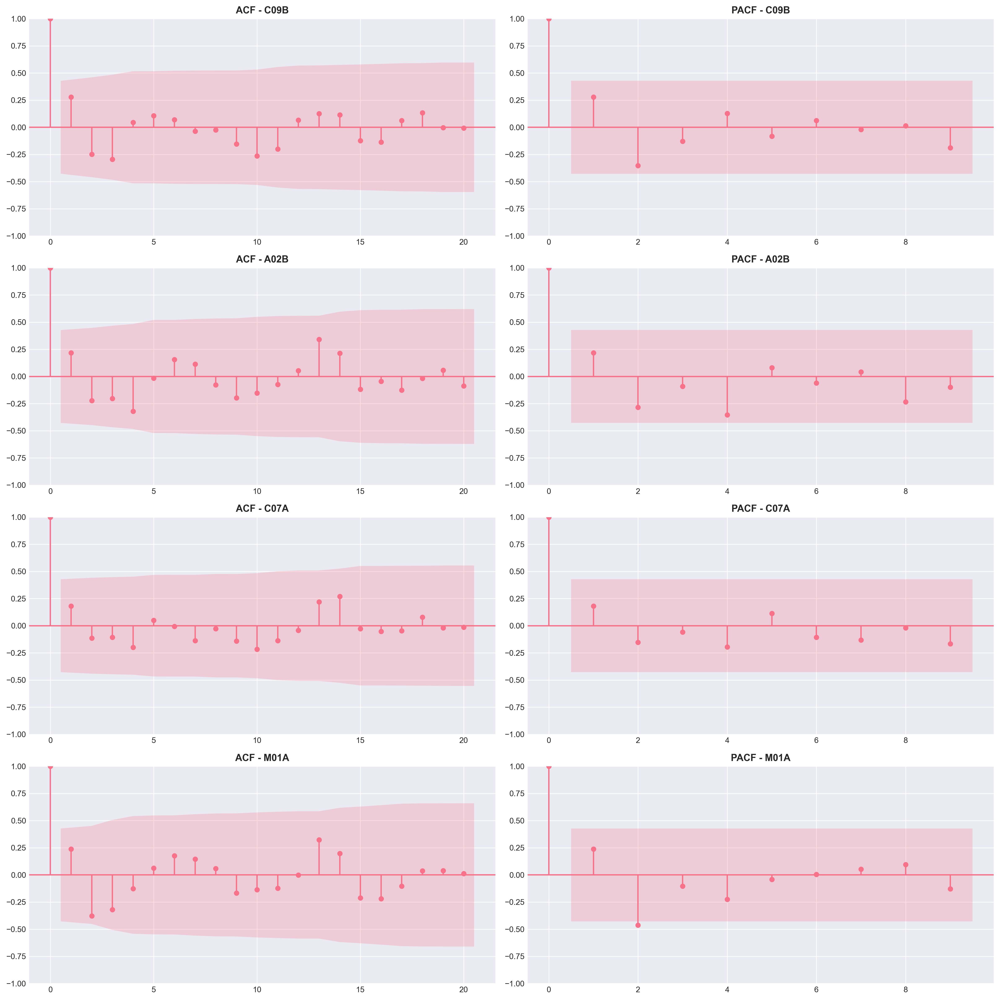

In [9]:
# ACF and PACF plots for top ATC3 codes
n_plots = min(4, len(top_atc3_codes))
fig, axes = plt.subplots(n_plots, 2, figsize=(16, 4*n_plots))

for idx, atc3 in enumerate(top_atc3_codes[:n_plots]):
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    ts = subset['packages'].values
    
    # Calculate appropriate number of lags
    # ACF can use up to len(ts)-1, but PACF requires lags < 50% of sample size
    max_lags_acf = min(24, len(ts) - 1)
    max_lags_pacf = min(24, max(1, len(ts) // 2 - 1))  # PACF: must be < 50% of sample
    
    # ACF
    plot_acf(ts, lags=max_lags_acf, ax=axes[idx, 0], title=f'ACF - {atc3}')
    axes[idx, 0].set_title(f'ACF - {atc3}', fontsize=11, fontweight='bold')
    
    # PACF (with adjusted lags)
    try:
        plot_pacf(ts, lags=max_lags_pacf, ax=axes[idx, 1], title=f'PACF - {atc3}')
        axes[idx, 1].set_title(f'PACF - {atc3}', fontsize=11, fontweight='bold')
    except ValueError as e:
        # If still fails, use even fewer lags
        max_lags_pacf = max(1, len(ts) // 4)
        plot_pacf(ts, lags=max_lags_pacf, ax=axes[idx, 1], title=f'PACF - {atc3}')
        axes[idx, 1].set_title(f'PACF - {atc3} (limited lags)', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig(output_dir / '04_acf_pacf.png', bbox_inches='tight', dpi=300)
plt.show()


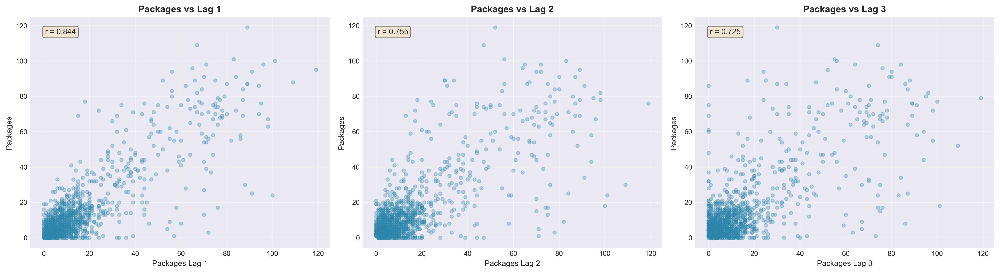

In [10]:
# Scatter plots: packages vs lag features
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, lag in enumerate([1, 2, 3]):
    lag_col = f'packages_lag{lag}'
    axes[idx].scatter(model_df[lag_col], model_df['packages'], 
                     alpha=0.3, s=20, color='#2E86AB')
    axes[idx].set_xlabel(f'Packages Lag {lag}', fontsize=10)
    axes[idx].set_ylabel('Packages', fontsize=10)
    axes[idx].set_title(f'Packages vs Lag {lag}', fontsize=12, fontweight='bold')
    axes[idx].grid(True, alpha=0.3)
    
    # Add correlation text
    corr_val = model_df[[lag_col, 'packages']].corr().iloc[0, 1]
    axes[idx].text(0.05, 0.95, f'r = {corr_val:.3f}', 
                  transform=axes[idx].transAxes, 
                  fontsize=10, verticalalignment='top',
                  bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.savefig(output_dir / '04_lag_scatter.png', bbox_inches='tight', dpi=300)
plt.show()



TIME SERIES DECOMPOSITION
Error decomposing C09B: x must have 2 complete cycles requires 24 observations. x only has 21 observation(s)
Error decomposing A02B: x must have 2 complete cycles requires 24 observations. x only has 21 observation(s)
Error decomposing C07A: x must have 2 complete cycles requires 24 observations. x only has 21 observation(s)
Error decomposing M01A: x must have 2 complete cycles requires 24 observations. x only has 21 observation(s)


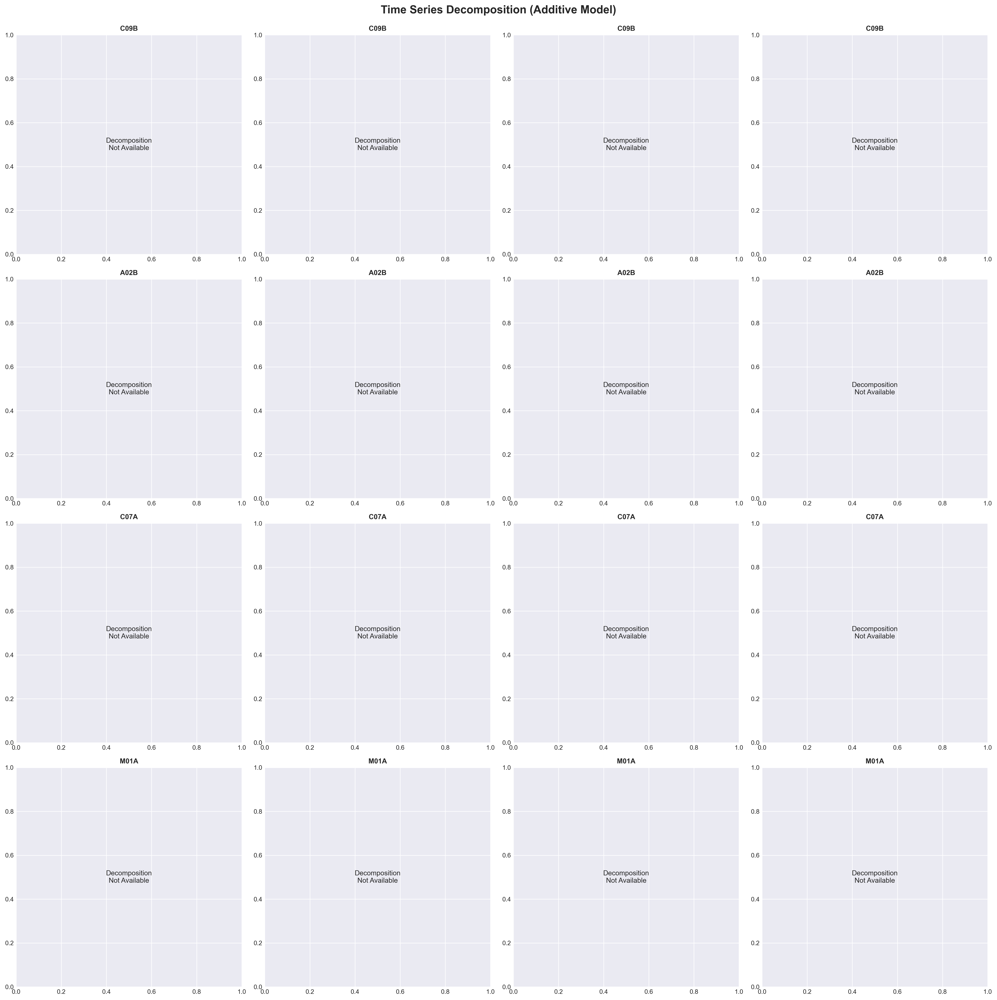

In [11]:
# ============================================================================
# 5. TIME SERIES DECOMPOSITION
# ============================================================================

print("\n" + "=" * 80)
print("TIME SERIES DECOMPOSITION")
print("=" * 80)

# Decompose top ATC3 codes
n_decomp = min(4, len(top_atc3_codes))
fig, axes = plt.subplots(n_decomp, 4, figsize=(20, 5*n_decomp))

for idx, atc3 in enumerate(top_atc3_codes[:n_decomp]):
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    ts = subset.set_index('month_start')['packages']
    
    # Additive decomposition
    try:
        decomp_add = seasonal_decompose(ts, model='additive', period=12, extrapolate_trend='freq')
        
        # Original
        axes[idx, 0].plot(ts.index, ts.values, linewidth=1.5, color='#2E86AB')
        axes[idx, 0].set_title(f'{atc3} - Original', fontsize=10, fontweight='bold')
        axes[idx, 0].set_ylabel('Packages', fontsize=9)
        axes[idx, 0].grid(True, alpha=0.3)
        
        # Trend
        axes[idx, 1].plot(decomp_add.trend.index, decomp_add.trend.values, 
                         linewidth=1.5, color='#A23B72')
        axes[idx, 1].set_title(f'{atc3} - Trend', fontsize=10, fontweight='bold')
        axes[idx, 1].set_ylabel('Trend', fontsize=9)
        axes[idx, 1].grid(True, alpha=0.3)
        
        # Seasonal
        axes[idx, 2].plot(decomp_add.seasonal.index, decomp_add.seasonal.values, 
                         linewidth=1.5, color='#F18F01')
        axes[idx, 2].set_title(f'{atc3} - Seasonal', fontsize=10, fontweight='bold')
        axes[idx, 2].set_ylabel('Seasonal', fontsize=9)
        axes[idx, 2].grid(True, alpha=0.3)
        
        # Residual
        axes[idx, 3].plot(decomp_add.resid.index, decomp_add.resid.values, 
                         linewidth=1.5, color='#C73E1D')
        axes[idx, 3].set_title(f'{atc3} - Residual', fontsize=10, fontweight='bold')
        axes[idx, 3].set_ylabel('Residual', fontsize=9)
        axes[idx, 3].grid(True, alpha=0.3)
        axes[idx, 3].axhline(y=0, color='black', linestyle='--', linewidth=0.5)
        
    except Exception as e:
        print(f"Error decomposing {atc3}: {e}")
        for j in range(4):
            axes[idx, j].text(0.5, 0.5, 'Decomposition\nNot Available', 
                            ha='center', va='center', transform=axes[idx, j].transAxes)
            axes[idx, j].set_title(f'{atc3}', fontsize=10, fontweight='bold')

plt.suptitle('Time Series Decomposition (Additive Model)', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(output_dir / '05_decomposition.png', bbox_inches='tight', dpi=300)
plt.show()



SEASONALITY ANALYSIS


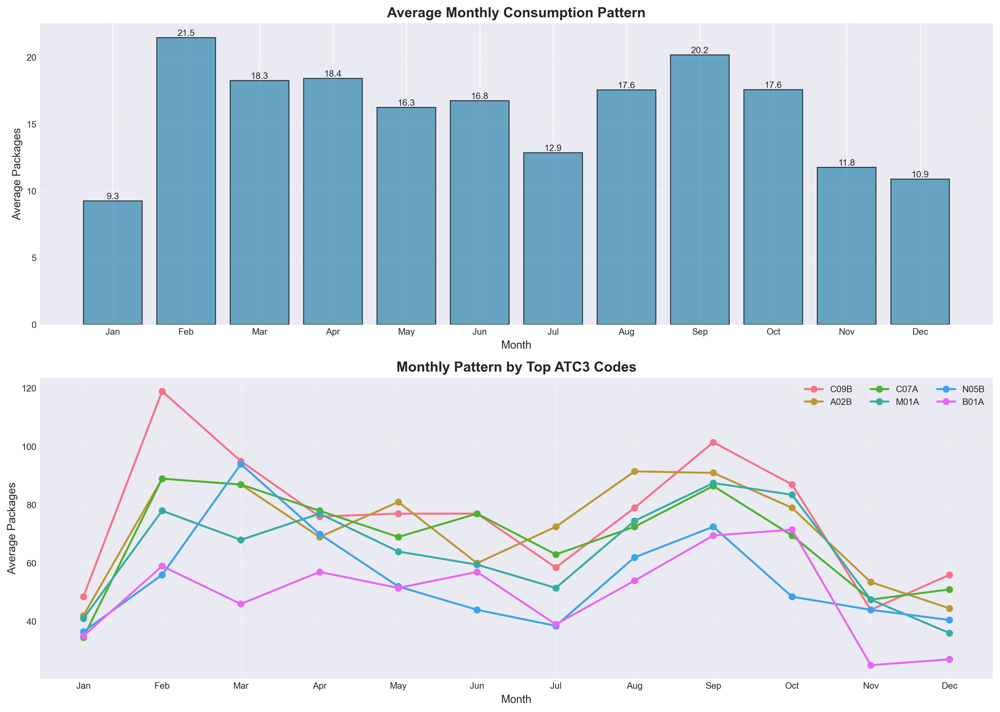


6.1 Seasonal Patterns:
----------------------------------------
Peak consumption month: Feb (Month 2)
Low consumption month: Jan (Month 1)
Peak/Low ratio: 2.32
Seasonal strength (CV): 0.242


In [12]:
# ============================================================================
# 6. SEASONALITY ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("SEASONALITY ANALYSIS")
print("=" * 80)

# Monthly seasonality
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Overall monthly pattern
monthly_avg = model_df.groupby('month')['packages'].mean()
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
axes[0].bar(range(1, 13), monthly_avg.values, color='#2E86AB', alpha=0.7, edgecolor='black')
axes[0].set_xticks(range(1, 13))
axes[0].set_xticklabels(month_names)
axes[0].set_title('Average Monthly Consumption Pattern', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Month', fontsize=11)
axes[0].set_ylabel('Average Packages', fontsize=11)
axes[0].grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for i, v in enumerate(monthly_avg.values):
    axes[0].text(i+1, v, f'{v:.1f}', ha='center', va='bottom', fontsize=9)

# Monthly pattern by top ATC3 codes
top_subset = model_df[model_df['atc3_code'].isin(top_atc3_codes[:6])]
monthly_by_atc3 = top_subset.groupby(['atc3_code', 'month'])['packages'].mean().reset_index()

for atc3 in top_atc3_codes[:6]:
    atc3_data = monthly_by_atc3[monthly_by_atc3['atc3_code'] == atc3]
    axes[1].plot(atc3_data['month'], atc3_data['packages'], 
                marker='o', label=atc3, linewidth=2, markersize=6)

axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels(month_names)
axes[1].set_title('Monthly Pattern by Top ATC3 Codes', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Month', fontsize=11)
axes[1].set_ylabel('Average Packages', fontsize=11)
axes[1].legend(loc='best', ncol=3, fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(output_dir / '03_seasonality_analysis.png', bbox_inches='tight', dpi=300)
plt.show()

# Identify peak and low months
peak_month = monthly_avg.idxmax()
low_month = monthly_avg.idxmin()
print(f"\n6.1 Seasonal Patterns:")
print("-" * 40)
print(f"Peak consumption month: {month_names[peak_month-1]} (Month {peak_month})")
print(f"Low consumption month: {month_names[low_month-1]} (Month {low_month})")
print(f"Peak/Low ratio: {monthly_avg[peak_month] / monthly_avg[low_month]:.2f}")

# Seasonal strength (coefficient of variation of monthly averages)
seasonal_strength = monthly_avg.std() / monthly_avg.mean()
print(f"Seasonal strength (CV): {seasonal_strength:.3f}")



STATIONARITY ANALYSIS

7.1 Stationarity Test Results:
----------------------------------------
atc3_code  adf_statistic  adf_pvalue  adf_stationary  kpss_statistic  kpss_pvalue  kpss_stationary  n_obs
     C09B      -2.094161    0.246869           False        0.113866          0.1             True     21
     A02B      -2.956816    0.039129            True        0.076502          0.1             True     21
     C07A      -1.931944    0.317186           False        0.097929          0.1             True     21
     M01A      -2.431946    0.132922           False        0.056249          0.1             True     21
     N05B      -4.255483    0.000530            True        0.054111          0.1             True     21
     B01A      -1.058188    0.731455           False        0.061999          0.1             True     21
     C10A      -2.804302    0.057662           False        0.088461          0.1             True     21
     C09A      -0.062611    0.953038           False    

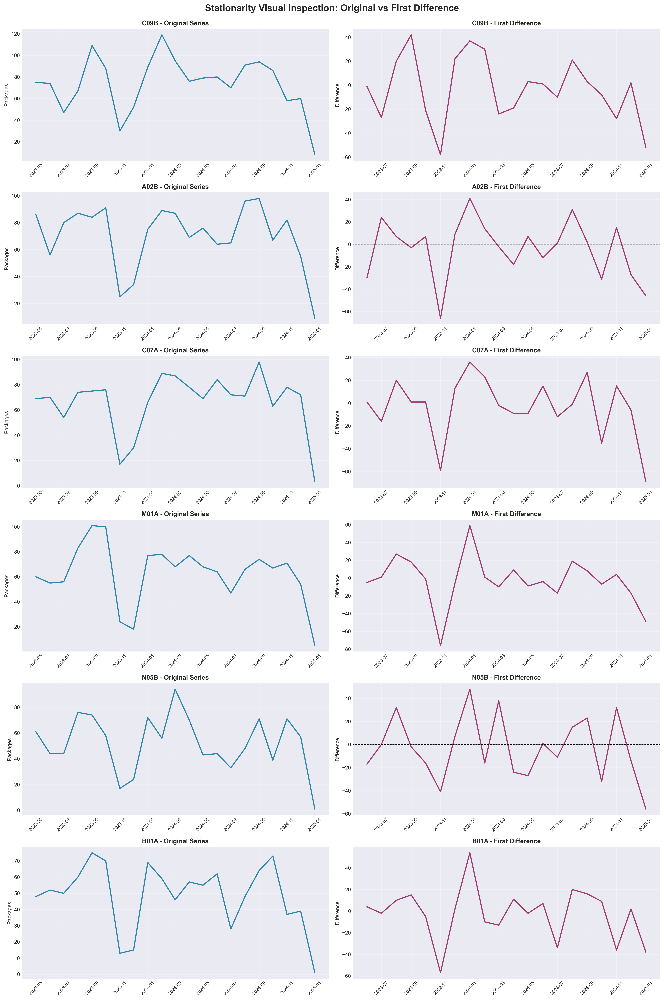

In [13]:
# ============================================================================
# 7. STATIONARITY ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("STATIONARITY ANALYSIS")
print("=" * 80)

# Perform ADF and KPSS tests for top ATC3 codes
stationarity_results = []

for atc3 in top_atc3_codes[:10]:
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    ts = subset['packages'].values
    
    if len(ts) < 10:  # Need minimum observations
        continue
    
    # ADF Test
    try:
        adf_result = adfuller(ts, autolag='AIC')
        adf_stat, adf_pvalue = adf_result[0], adf_result[1]
        is_stationary_adf = adf_pvalue < 0.05
    except:
        adf_stat, adf_pvalue, is_stationary_adf = np.nan, np.nan, False
    
    # KPSS Test
    try:
        kpss_result = kpss(ts, regression='ct', nlags='auto')
        kpss_stat, kpss_pvalue = kpss_result[0], kpss_result[1]
        is_stationary_kpss = kpss_pvalue > 0.05
    except:
        kpss_stat, kpss_pvalue, is_stationary_kpss = np.nan, np.nan, False
    
    stationarity_results.append({
        'atc3_code': atc3,
        'adf_statistic': adf_stat,
        'adf_pvalue': adf_pvalue,
        'adf_stationary': is_stationary_adf,
        'kpss_statistic': kpss_stat,
        'kpss_pvalue': kpss_pvalue,
        'kpss_stationary': is_stationary_kpss,
        'n_obs': len(ts)
    })

stationarity_df = pd.DataFrame(stationarity_results)
print("\n7.1 Stationarity Test Results:")
print("-" * 40)
print(stationarity_df.to_string(index=False))

# Visual inspection of trends
n_plots = min(6, len(top_atc3_codes))
fig, axes = plt.subplots(n_plots, 2, figsize=(16, 4*n_plots))

for idx, atc3 in enumerate(top_atc3_codes[:n_plots]):
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    
    # Original series
    axes[idx, 0].plot(subset['month_start'], subset['packages'], 
                     linewidth=2, color='#2E86AB', label='Original')
    axes[idx, 0].set_title(f'{atc3} - Original Series', fontsize=11, fontweight='bold')
    axes[idx, 0].set_ylabel('Packages', fontsize=9)
    axes[idx, 0].grid(True, alpha=0.3)
    axes[idx, 0].tick_params(axis='x', rotation=45, labelsize=8)
    
    # First difference
    diff = subset['packages'].diff().dropna()
    diff_dates = subset['month_start'].iloc[1:]
    axes[idx, 1].plot(diff_dates, diff.values, 
                     linewidth=2, color='#A23B72', label='First Difference')
    axes[idx, 1].axhline(y=0, color='black', linestyle='--', linewidth=0.5)
    axes[idx, 1].set_title(f'{atc3} - First Difference', fontsize=11, fontweight='bold')
    axes[idx, 1].set_ylabel('Difference', fontsize=9)
    axes[idx, 1].grid(True, alpha=0.3)
    axes[idx, 1].tick_params(axis='x', rotation=45, labelsize=8)

plt.suptitle('Stationarity Visual Inspection: Original vs First Difference', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(output_dir / '06_stationarity_tests.png', bbox_inches='tight', dpi=300)
plt.show()



CROSS-SERIES ANALYSIS

8.1 Growth Rates (Top 15 by Consumption):
----------------------------------------
atc3_code  growth_rate_annualized  total_consumption  n_months
     C09B              -72.165217               1547        21
     A02B              -72.466987               1475        21
     C07A              -83.332525               1395        21
     M01A              -75.827309               1313        21
     N05B              -90.454218               1097        21
     B01A              -89.053111               1021        21
     C10A              -58.040774                826        21
     C09A             -100.000000                658        21
     A10B             -100.000000                658        21
     N02A             -100.000000                500        21
     R03A             -100.000000                418        21
     C08C             -100.000000                401        21
     N02B             -100.000000                381        21
     N06B  

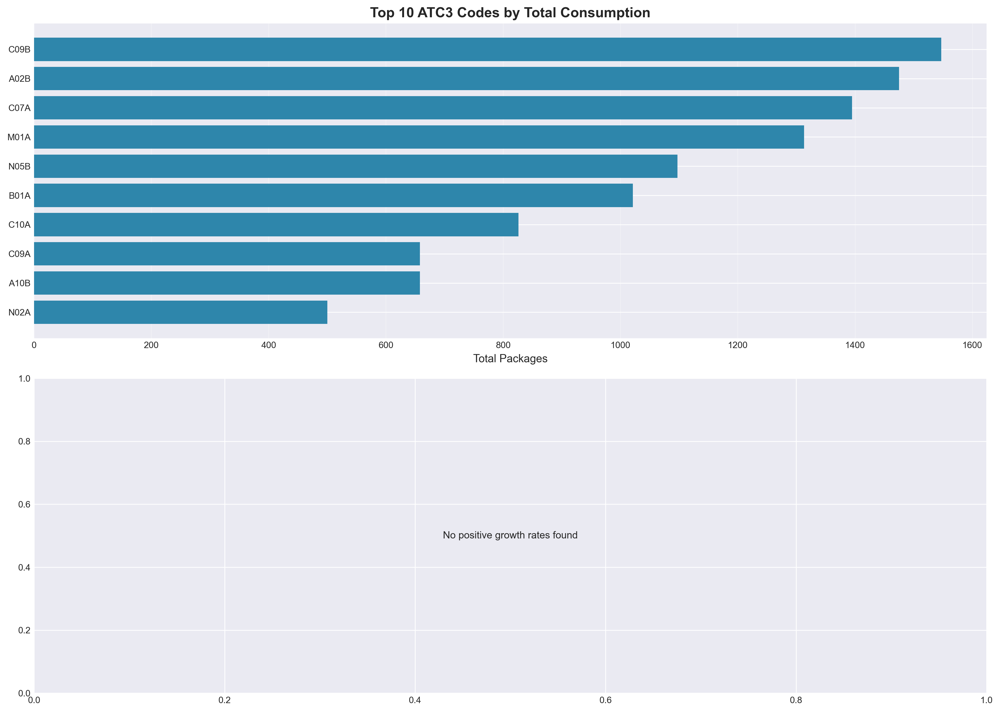

In [14]:
# ============================================================================
# 8. CROSS-SERIES ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("CROSS-SERIES ANALYSIS")
print("=" * 80)

# Growth rates by ATC3 code
growth_rates = []
for atc3 in model_df['atc3_code'].unique():
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    if len(subset) < 2:
        continue
    
    first_val = subset['packages'].iloc[0]
    last_val = subset['packages'].iloc[-1]
    n_months = len(subset)
    
    if first_val > 0:
        growth_rate = ((last_val / first_val) ** (12 / n_months) - 1) * 100  # Annualized
    else:
        growth_rate = np.nan
    
    total_consumption = subset['packages'].sum()
    growth_rates.append({
        'atc3_code': atc3,
        'growth_rate_annualized': growth_rate,
        'total_consumption': total_consumption,
        'n_months': n_months
    })

growth_df = pd.DataFrame(growth_rates).sort_values('total_consumption', ascending=False)
print("\n8.1 Growth Rates (Top 15 by Consumption):")
print("-" * 40)
print(growth_df.head(15).to_string(index=False))

# Visualization: Top vs Bottom consumption codes
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Top 10 by total consumption
top_10 = growth_df.head(10)
axes[0].barh(range(len(top_10)), top_10['total_consumption'].values, color='#2E86AB')
axes[0].set_yticks(range(len(top_10)))
axes[0].set_yticklabels(top_10['atc3_code'].values)
axes[0].set_xlabel('Total Packages', fontsize=11)
axes[0].set_title('Top 10 ATC3 Codes by Total Consumption', fontsize=14, fontweight='bold')
axes[0].grid(True, alpha=0.3, axis='x')
axes[0].invert_yaxis()

# Growth rates (for codes with positive growth)
positive_growth = growth_df[growth_df['growth_rate_annualized'] > 0].head(10)
if len(positive_growth) > 0:
    axes[1].barh(range(len(positive_growth)), positive_growth['growth_rate_annualized'].values, 
                color='#A23B72')
    axes[1].set_yticks(range(len(positive_growth)))
    axes[1].set_yticklabels(positive_growth['atc3_code'].values)
    axes[1].set_xlabel('Annualized Growth Rate (%)', fontsize=11)
    axes[1].set_title('Top 10 ATC3 Codes by Growth Rate', fontsize=14, fontweight='bold')
    axes[1].grid(True, alpha=0.3, axis='x')
    axes[1].invert_yaxis()
    axes[1].axvline(x=0, color='black', linestyle='-', linewidth=0.5)
else:
    axes[1].text(0.5, 0.5, 'No positive growth rates found', 
                ha='center', va='center', transform=axes[1].transAxes)

plt.tight_layout()
plt.savefig(output_dir / '07_cross_series_analysis.png', bbox_inches='tight', dpi=300)
plt.show()


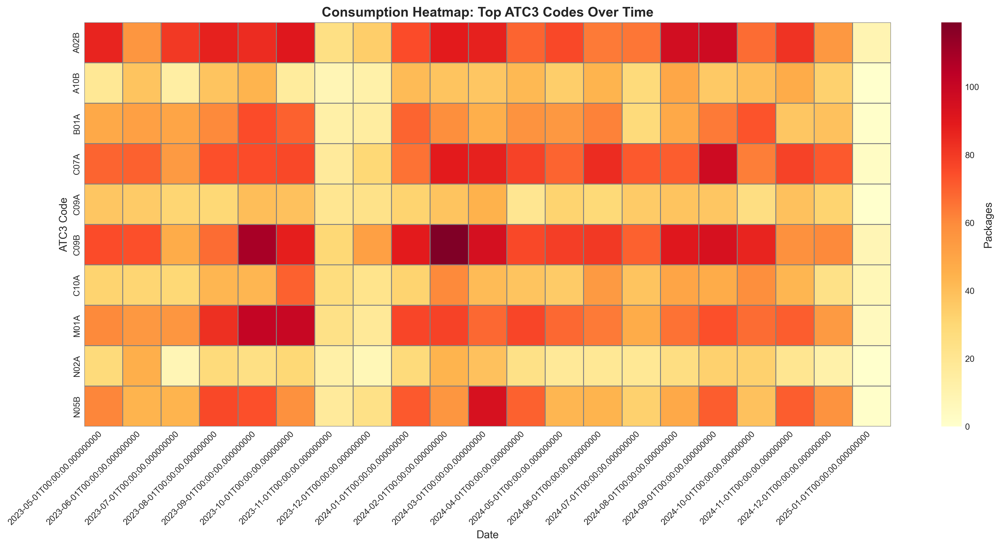

In [15]:
# Compare consumption patterns - heatmap of top codes over time
top_subset = model_df[model_df['atc3_code'].isin(top_atc3_codes[:12])].copy()
pivot_data = top_subset.pivot_table(
    index='month_start', 
    columns='atc3_code', 
    values='packages', 
    aggfunc='sum'
).fillna(0)

fig, ax = plt.subplots(figsize=(16, 8))
sns.heatmap(pivot_data.T, cmap='YlOrRd', cbar_kws={'label': 'Packages'}, 
           ax=ax, linewidths=0.5, linecolor='gray')
ax.set_title('Consumption Heatmap: Top ATC3 Codes Over Time', 
            fontsize=14, fontweight='bold')
ax.set_xlabel('Date', fontsize=11)
ax.set_ylabel('ATC3 Code', fontsize=11)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(output_dir / '07_consumption_heatmap.png', bbox_inches='tight', dpi=300)
plt.show()



FEATURE ANALYSIS


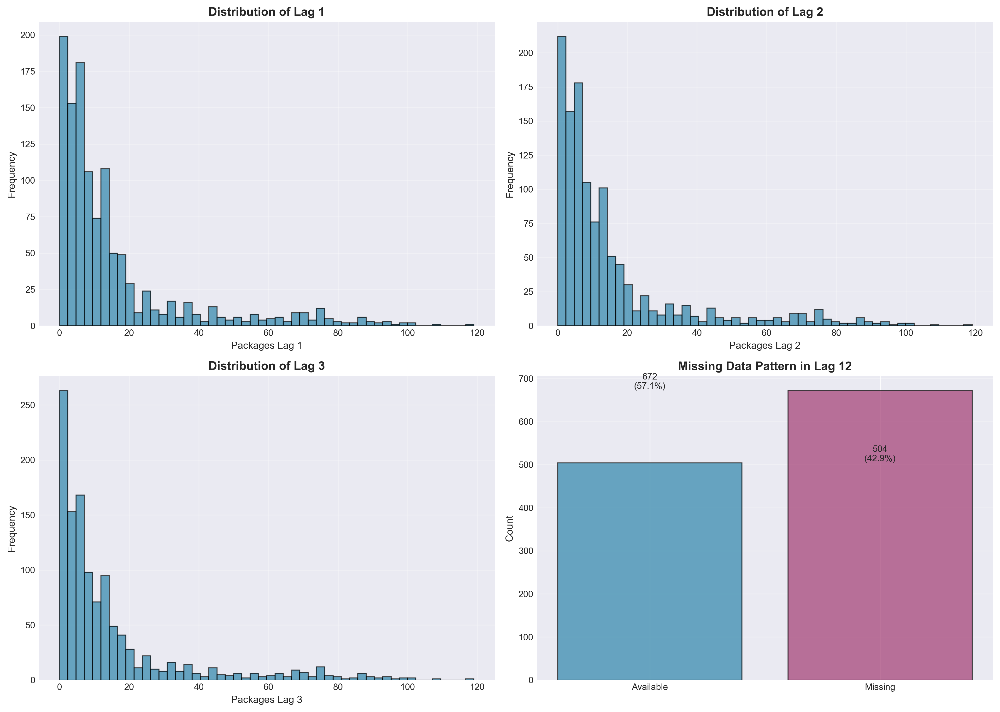


9.1 Lag Feature Statistics:
----------------------------------------
       packages_lag1  packages_lag2  packages_lag3
count    1176.000000    1176.000000    1176.000000
mean       15.948980      15.568027      14.710034
std        20.357046      20.206394      19.985614
min         0.000000       0.000000       0.000000
25%         4.000000       4.000000       3.000000
50%         9.000000       8.000000       8.000000
75%        17.000000      17.000000      16.000000
max       119.000000     119.000000     119.000000


In [16]:
# ============================================================================
# 9. FEATURE ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("FEATURE ANALYSIS")
print("=" * 80)

# Lag feature distributions
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for idx, lag in enumerate([1, 2, 3]):
    lag_col = f'packages_lag{lag}'
    row = idx // 2
    col = idx % 2
    
    axes[row, col].hist(model_df[lag_col].dropna(), bins=50, 
                        edgecolor='black', alpha=0.7, color='#2E86AB')
    axes[row, col].set_title(f'Distribution of Lag {lag}', fontsize=12, fontweight='bold')
    axes[row, col].set_xlabel(f'Packages Lag {lag}', fontsize=10)
    axes[row, col].set_ylabel('Frequency', fontsize=10)
    axes[row, col].grid(True, alpha=0.3)

# Missing data pattern in lag12
lag12_missing = model_df['packages_lag12'].isna()
axes[1, 1].bar(['Available', 'Missing'], 
              [lag12_missing.sum(), (~lag12_missing).sum()], 
              color=['#2E86AB', '#A23B72'], alpha=0.7, edgecolor='black')
axes[1, 1].set_title('Missing Data Pattern in Lag 12', fontsize=12, fontweight='bold')
axes[1, 1].set_ylabel('Count', fontsize=10)
axes[1, 1].grid(True, alpha=0.3, axis='y')

# Add percentage labels
total = len(model_df)
missing_count = lag12_missing.sum()
available_count = (~lag12_missing).sum()
axes[1, 1].text(0, available_count, f'{available_count}\n({available_count/total*100:.1f}%)', 
               ha='center', va='bottom', fontsize=9)
axes[1, 1].text(1, missing_count, f'{missing_count}\n({missing_count/total*100:.1f}%)', 
               ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(output_dir / '08_feature_analysis.png', bbox_inches='tight', dpi=300)
plt.show()

print("\n9.1 Lag Feature Statistics:")
print("-" * 40)
lag_stats = model_df[['packages_lag1', 'packages_lag2', 'packages_lag3']].describe()
print(lag_stats)



OUTLIER DETECTION

10.1 Outlier Detection Results:
----------------------------------------
IQR Method (1.5*IQR): 132 outliers (11.22%)
Z-score Method (|z| > 3): 33 outliers (2.81%)
IQR bounds: [-18.00, 38.00]


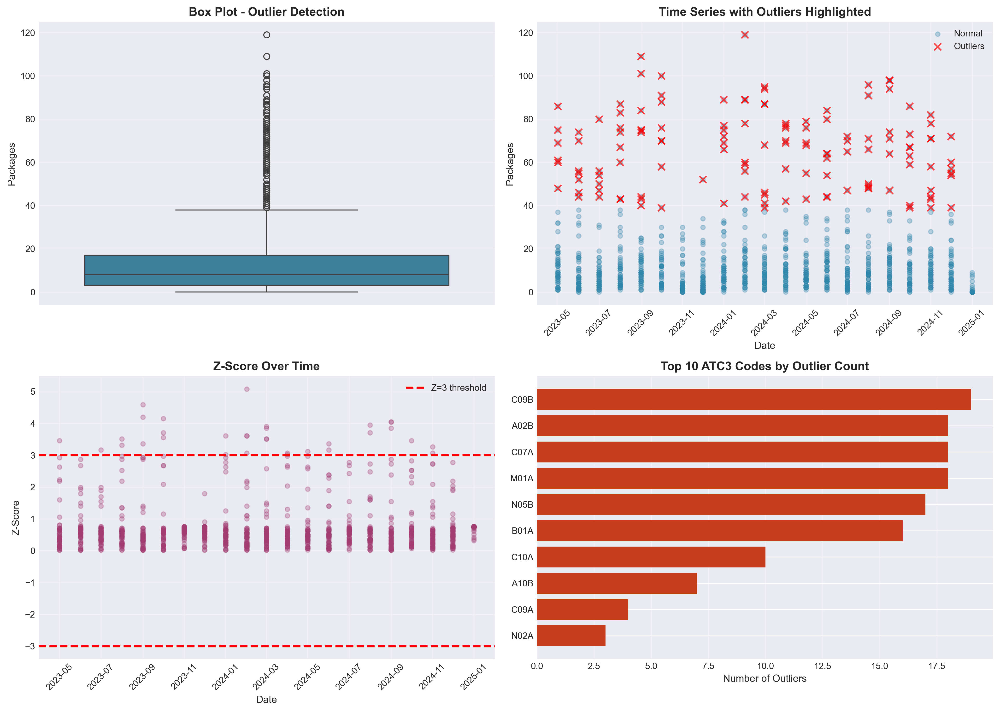

In [17]:
# ============================================================================
# 10. OUTLIER DETECTION
# ============================================================================

print("\n" + "=" * 80)
print("OUTLIER DETECTION")
print("=" * 80)

# IQR method
Q1 = model_df['packages'].quantile(0.25)
Q3 = model_df['packages'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_iqr = ((model_df['packages'] < lower_bound) | (model_df['packages'] > upper_bound)).sum()

# Z-score method
z_scores = np.abs(stats.zscore(model_df['packages']))
outliers_zscore = (z_scores > 3).sum()

print(f"\n10.1 Outlier Detection Results:")
print("-" * 40)
print(f"IQR Method (1.5*IQR): {outliers_iqr} outliers ({outliers_iqr/len(model_df)*100:.2f}%)")
print(f"Z-score Method (|z| > 3): {outliers_zscore} outliers ({outliers_zscore/len(model_df)*100:.2f}%)")
print(f"IQR bounds: [{lower_bound:.2f}, {upper_bound:.2f}]")

# Visualize outliers
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Box plot
sns.boxplot(y=model_df['packages'], ax=axes[0, 0], color='#2E86AB')
axes[0, 0].set_title('Box Plot - Outlier Detection', fontsize=12, fontweight='bold')
axes[0, 0].set_ylabel('Packages', fontsize=10)
axes[0, 0].grid(True, alpha=0.3, axis='y')

# Time series with outliers highlighted
outlier_mask = (model_df['packages'] < lower_bound) | (model_df['packages'] > upper_bound)
axes[0, 1].scatter(model_df['month_start'], model_df['packages'], 
                  alpha=0.3, s=20, color='#2E86AB', label='Normal')
axes[0, 1].scatter(model_df.loc[outlier_mask, 'month_start'], 
                  model_df.loc[outlier_mask, 'packages'],
                  alpha=0.7, s=50, color='red', label='Outliers', marker='x')
axes[0, 1].set_title('Time Series with Outliers Highlighted', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Date', fontsize=10)
axes[0, 1].set_ylabel('Packages', fontsize=10)
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].tick_params(axis='x', rotation=45)

# Z-score plot
axes[1, 0].scatter(model_df['month_start'], z_scores, alpha=0.3, s=20, color='#A23B72')
axes[1, 0].axhline(y=3, color='red', linestyle='--', linewidth=2, label='Z=3 threshold')
axes[1, 0].axhline(y=-3, color='red', linestyle='--', linewidth=2)
axes[1, 0].set_title('Z-Score Over Time', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Date', fontsize=10)
axes[1, 0].set_ylabel('Z-Score', fontsize=10)
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].tick_params(axis='x', rotation=45)

# Outliers by ATC3 code
if outlier_mask.sum() > 0:
    outlier_by_atc3 = model_df[outlier_mask].groupby('atc3_code').size().sort_values(ascending=False).head(10)
    axes[1, 1].barh(range(len(outlier_by_atc3)), outlier_by_atc3.values, color='#C73E1D')
    axes[1, 1].set_yticks(range(len(outlier_by_atc3)))
    axes[1, 1].set_yticklabels(outlier_by_atc3.index)
    axes[1, 1].set_xlabel('Number of Outliers', fontsize=10)
    axes[1, 1].set_title('Top 10 ATC3 Codes by Outlier Count', fontsize=12, fontweight='bold')
    axes[1, 1].grid(True, alpha=0.3, axis='x')
    axes[1, 1].invert_yaxis()
else:
    axes[1, 1].text(0.5, 0.5, 'No outliers detected', 
                   ha='center', va='center', transform=axes[1, 1].transAxes)

plt.tight_layout()
plt.savefig(output_dir / '09_outlier_detection.png', bbox_inches='tight', dpi=300)
plt.show()


In [18]:
# Fix: Correct the bar chart labels for missing data
lag12_missing = model_df['packages_lag12'].isna()
available_count = (~lag12_missing).sum()
missing_count = lag12_missing.sum()

# ============================================================================
# 12. EDA SUMMARY
# ============================================================================

print("\n" + "=" * 80)
print("EDA SUMMARY")
print("=" * 80)

print("\nKey Findings:")
print("-" * 40)
print(f"1. Dataset contains {model_df['atc3_code'].nunique()} unique ATC3 codes")
print(f"2. Time period: {model_df['month_start'].min().strftime('%Y-%m')} to {model_df['month_start'].max().strftime('%Y-%m')}")
print(f"3. Total observations: {len(model_df):,}")
print(f"4. Missing data in lag12: {missing_count} ({missing_count/len(model_df)*100:.1f}%)")
print(f"5. Top ATC3 code by consumption: {top_atc3_codes[0] if len(top_atc3_codes) > 0 else 'N/A'}")
print(f"6. Overall skewness: {model_df['packages'].skew():.3f}")
print(f"7. Overall kurtosis: {model_df['packages'].kurtosis():.3f}")

print(f"\nAll plots saved to: {output_dir.absolute()}")
print(f"Summary statistics saved to: {output_dir / 'summary_statistics.csv'}")
print("\nEDA Complete!")



EDA SUMMARY

Key Findings:
----------------------------------------
1. Dataset contains 56 unique ATC3 codes
2. Time period: 2023-05 to 2025-01
3. Total observations: 1,176
4. Missing data in lag12: 504 (42.9%)
5. Top ATC3 code by consumption: C09B
6. Overall skewness: 2.252
7. Overall kurtosis: 4.767

All plots saved to: /Users/edonisalijaj/Downloads/tsfdc/notebooks/../eda_plots
Summary statistics saved to: ../eda_plots/summary_statistics.csv

EDA Complete!



COMPREHENSIVE SUMMARY STATISTICS

11.1 Summary Statistics Table (Top 20):
----------------------------------------
atc3_code  total_packages      mean       std  min  max  n_months      trend  seasonal_strength  growth_rate_annualized
     C09B            1547 73.666667 25.525151    8  119        21     Stable           0.291479              -72.165217
     A02B            1475 70.238095 23.590050    9   98        21     Stable           0.250162              -72.466987
     C07A            1395 66.428571 23.234826    3   98        21 Increasing           0.248209              -83.332525
     M01A            1313 62.523810 23.932445    5  101        21     Stable           0.265896              -75.827309
     N05B            1097 52.238095 22.198885    1   94        21     Stable           0.311789              -90.454218
     B01A            1021 48.619048 20.330952    1   75        21     Stable           0.308871              -89.053111
     C10A             826 39.333333 14.49942

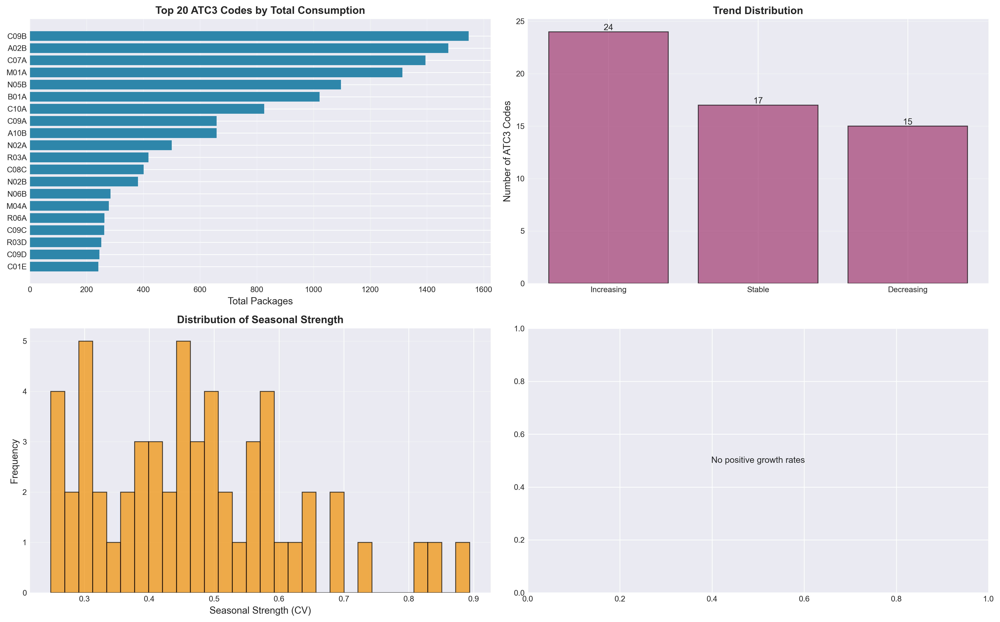

In [19]:
# ============================================================================
# 11. COMPREHENSIVE SUMMARY STATISTICS TABLE
# ============================================================================

print("\n" + "=" * 80)
print("COMPREHENSIVE SUMMARY STATISTICS")
print("=" * 80)

# Calculate comprehensive statistics by ATC3 code
summary_stats = []

for atc3 in model_df['atc3_code'].unique():
    subset = model_df[model_df['atc3_code'] == atc3].sort_values('month_start')
    
    if len(subset) < 2:
        continue
    
    # Basic statistics
    total_packages = subset['packages'].sum()
    mean_packages = subset['packages'].mean()
    std_packages = subset['packages'].std()
    min_packages = subset['packages'].min()
    max_packages = subset['packages'].max()
    median_packages = subset['packages'].median()
    n_months = len(subset)
    n_zero = (subset['packages'] == 0).sum()
    
    # Trend direction
    first_half = subset['packages'].iloc[:len(subset)//2].mean()
    second_half = subset['packages'].iloc[len(subset)//2:].mean()
    if second_half > first_half * 1.1:
        trend = 'Increasing'
    elif second_half < first_half * 0.9:
        trend = 'Decreasing'
    else:
        trend = 'Stable'
    
    # Seasonality strength (coefficient of variation of monthly averages)
    monthly_avg = subset.groupby('month')['packages'].mean()
    if monthly_avg.mean() > 0:
        seasonal_strength = monthly_avg.std() / monthly_avg.mean()
    else:
        seasonal_strength = 0
    
    # Growth rate
    first_val = subset['packages'].iloc[0]
    last_val = subset['packages'].iloc[-1]
    if first_val > 0 and n_months > 0:
        growth_rate = ((last_val / first_val) ** (12 / n_months) - 1) * 100
    else:
        growth_rate = 0
    
    summary_stats.append({
        'atc3_code': atc3,
        'total_packages': total_packages,
        'mean': mean_packages,
        'std': std_packages,
        'min': min_packages,
        'max': max_packages,
        'median': median_packages,
        'n_months': n_months,
        'n_zero_months': n_zero,
        'pct_zero': (n_zero / n_months) * 100,
        'trend': trend,
        'seasonal_strength': seasonal_strength,
        'growth_rate_annualized': growth_rate
    })

summary_table = pd.DataFrame(summary_stats)
summary_table = summary_table.sort_values('total_packages', ascending=False)

print("\n11.1 Summary Statistics Table (Top 20):")
print("-" * 40)
display_cols = ['atc3_code', 'total_packages', 'mean', 'std', 'min', 'max', 
               'n_months', 'trend', 'seasonal_strength', 'growth_rate_annualized']
print(summary_table[display_cols].head(20).to_string(index=False))

# Save summary table
summary_table.to_csv(output_dir / 'summary_statistics.csv', index=False)
print(f"\nSummary statistics saved to: {output_dir / 'summary_statistics.csv'}")

# Create visualization of key metrics
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Total consumption
top_20 = summary_table.head(20)
axes[0, 0].barh(range(len(top_20)), top_20['total_packages'].values, color='#2E86AB')
axes[0, 0].set_yticks(range(len(top_20)))
axes[0, 0].set_yticklabels(top_20['atc3_code'].values)
axes[0, 0].set_xlabel('Total Packages', fontsize=11)
axes[0, 0].set_title('Top 20 ATC3 Codes by Total Consumption', fontsize=12, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3, axis='x')
axes[0, 0].invert_yaxis()

# Trend distribution
trend_counts = summary_table['trend'].value_counts()
axes[0, 1].bar(trend_counts.index, trend_counts.values, color='#A23B72', alpha=0.7, edgecolor='black')
axes[0, 1].set_title('Trend Distribution', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('Number of ATC3 Codes', fontsize=11)
axes[0, 1].grid(True, alpha=0.3, axis='y')
for i, v in enumerate(trend_counts.values):
    axes[0, 1].text(i, v, str(v), ha='center', va='bottom', fontsize=10)

# Seasonal strength distribution
axes[1, 0].hist(summary_table['seasonal_strength'], bins=30, 
               edgecolor='black', alpha=0.7, color='#F18F01')
axes[1, 0].set_title('Distribution of Seasonal Strength', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Seasonal Strength (CV)', fontsize=11)
axes[1, 0].set_ylabel('Frequency', fontsize=11)
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Growth rate distribution
growth_positive = summary_table[summary_table['growth_rate_annualized'] > 0]
if len(growth_positive) > 0:
    axes[1, 1].hist(growth_positive['growth_rate_annualized'], bins=30, 
                   edgecolor='black', alpha=0.7, color='#C73E1D')
    axes[1, 1].set_title('Distribution of Annualized Growth Rates (Positive Only)', 
                        fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('Growth Rate (%)', fontsize=11)
    axes[1, 1].set_ylabel('Frequency', fontsize=11)
    axes[1, 1].grid(True, alpha=0.3, axis='y')
else:
    axes[1, 1].text(0.5, 0.5, 'No positive growth rates', 
                   ha='center', va='center', transform=axes[1, 1].transAxes)

plt.tight_layout()
plt.savefig(output_dir / '10_summary_statistics.png', bbox_inches='tight', dpi=300)
plt.show()
